# EDA

In [2]:
import pandas as pd
import torchvision.transforms.v2 as transforms

In [3]:
annotations_file_path = "../../.data/annotations.csv"

In [29]:
transform = transforms.Compose(
    [
        transforms.Resize(256, interpolation=transforms.InterpolationMode.BILINEAR),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        # transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ]
)

In [5]:
# Read the annotations file into a DataFrame
df = pd.read_csv(annotations_file_path)


In [6]:
df.head()

,image,width,height,label,crop_type
0,spectrometry-cassava-dataset/Field Experiment/...,3120,4160,HLT,cassava
1,spectrometry-cassava-dataset/Field Experiment/...,3120,4160,HLT,cassava
2,spectrometry-cassava-dataset/Field Experiment/...,3120,4160,HLT,cassava
3,spectrometry-cassava-dataset/Field Experiment/...,3120,4160,HLT,cassava
4,spectrometry-cassava-dataset/Field Experiment/...,3120,4160,HLT,cassava


<Axes: ylabel='Frequency'>

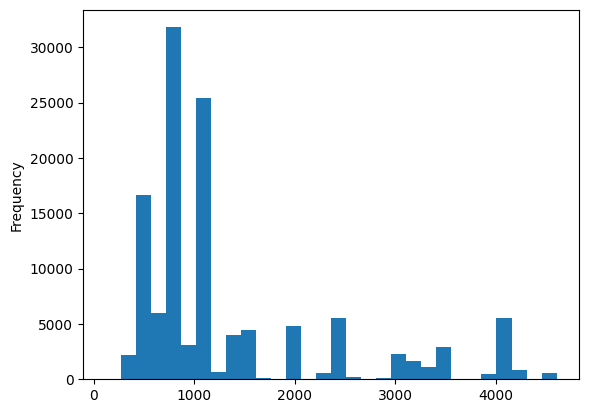

In [12]:
# Create a histogram of the 'width' column
df['width'].plot(kind='hist', bins=30)

<Axes: ylabel='Frequency'>

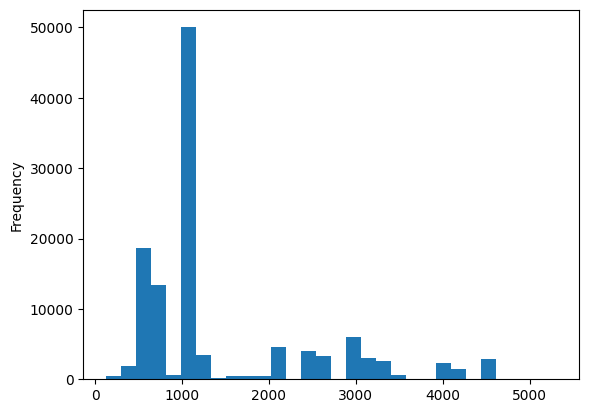

In [13]:
# Create a histogram of the 'height' column
df['height'].plot(kind='hist', bins=30)

Number of distinct pairs (width, height):  308
Number of distinct pairs ignoring order:  264


<Axes: title={'center': 'Top 30 pairs (width, height)'}, xlabel='pair'>

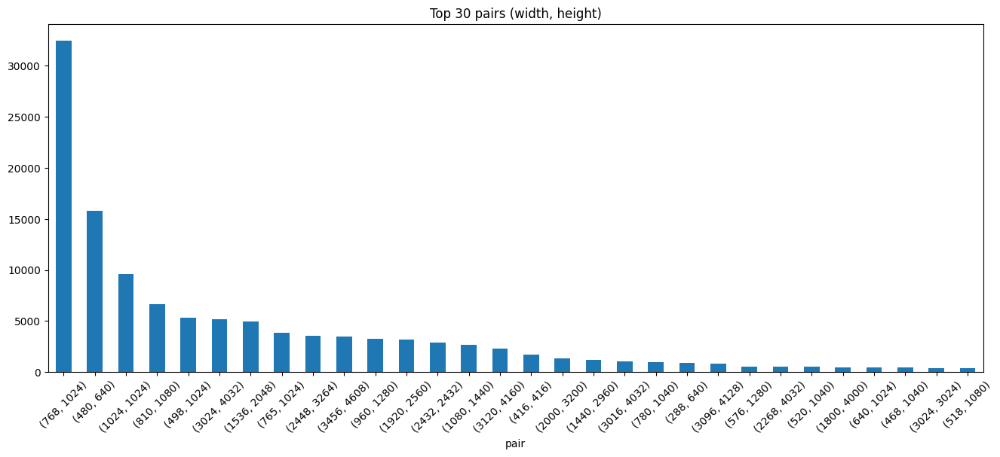

In [16]:
# Compute the number of distinct pairs (width, height)
distinct_pairs = df.drop_duplicates(subset=['width', 'height'])

# Compute the number of pairs where the ordering is ignored
df['pair'] = df.apply(lambda row: tuple(sorted([row['width'], row['height']])), axis=1)

# Print the number of distinct pairs
print("Number of distinct pairs (width, height): ", len(distinct_pairs))
print("Number of distinct pairs ignoring order: ", len(df['pair'].unique()))

# Plot the distinct pairs, limiting to the top k occurrences
counts = df['pair'].value_counts()
k = 30
counts.head(k).plot(kind='bar', figsize=(16, 6), title=f'Top {k} pairs (width, height)', rot=45)

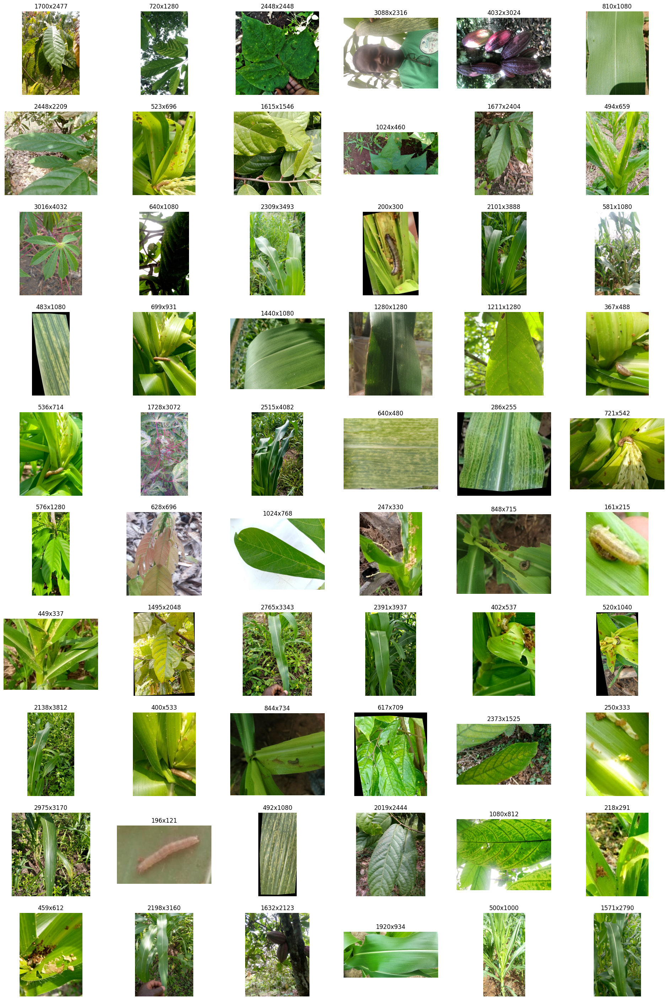

In [22]:
# Pick an image from each of the different dimension pairs and display them
import matplotlib.pyplot as plt
import os
from PIL import Image

# Get the first image for each pair
first_images = df.groupby('pair').first().sample(n=60)

# Display the images
fig, axs = plt.subplots(10, 6, figsize=(24, 36))
for i, (_, row) in enumerate(first_images.iterrows()):
    img = Image.open(os.path.join('../../.data/', row['image']))
    ax = axs[i // 6, i % 6]
    ax.imshow(img)
    ax.axis('off')
    ax.set_title(f"{row['width']}x{row['height']}")

Max: 1.0, Min: 0.0
Max: 1.0, Min: 0.0117647061124444
Max: 1.0, Min: 0.0
Max: 1.0, Min: 0.0941176488995552
Max: 1.0, Min: 0.0
Max: 0.9490196108818054, Min: 0.003921568859368563
Max: 1.0, Min: 0.0
Max: 1.0, Min: 0.0
Max: 1.0, Min: 0.0
Max: 1.0, Min: 0.0
Max: 1.0, Min: 0.0
Max: 1.0, Min: 0.0
Max: 0.9921568632125854, Min: 0.0470588244497776
Max: 1.0, Min: 0.0
Max: 1.0, Min: 0.0
Max: 0.9215686321258545, Min: 0.0
Max: 0.9686274528503418, Min: 0.0
Max: 1.0, Min: 0.0117647061124444
Max: 0.8784313797950745, Min: 0.0
Max: 1.0, Min: 0.0
Max: 0.9725490212440491, Min: 0.0
Max: 0.9843137264251709, Min: 0.0470588244497776
Max: 1.0, Min: 0.0
Max: 1.0, Min: 0.0
Max: 1.0, Min: 0.0
Max: 1.0, Min: 0.13725490868091583
Max: 0.9921568632125854, Min: 0.0
Max: 0.9019607901573181, Min: 0.11372549086809158
Max: 0.9803921580314636, Min: 0.0
Max: 1.0, Min: 0.0
Max: 0.9843137264251709, Min: 0.0
Max: 1.0, Min: 0.10980392247438431
Max: 1.0, Min: 0.0
Max: 1.0, Min: 0.0
Max: 0.7333333492279053, Min: 0.0
Max: 1.0, Min: 

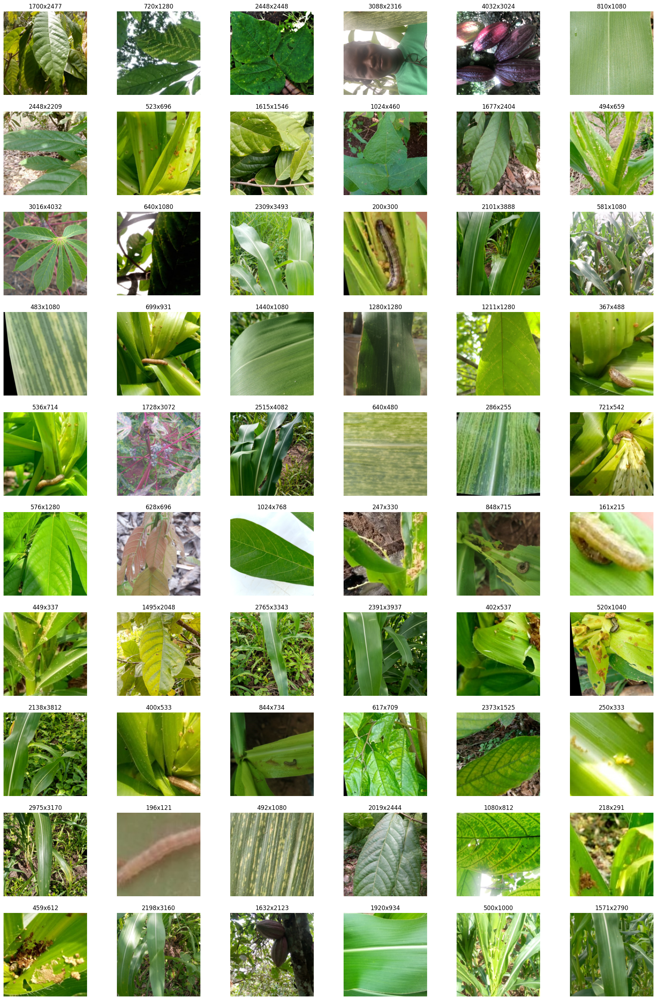

In [30]:
# Now display the images after applying the defined transformation
fig, axs = plt.subplots(10, 6, figsize=(24, 36))
for i, (_, row) in enumerate(first_images.iterrows()):
    img = Image.open(os.path.join('../../.data/', row['image']))
    img = transform(img)
    # print the max and min values of the image tensor
    print(f"Max: {img.max()}, Min: {img.min()}")
    ax = axs[i // 6, i % 6]
    ax.imshow(img.permute(1, 2, 0))
    ax.axis('off')
    ax.set_title(f"{row['width']}x{row['height']}")

In [ ]:
# Plot class distribution
